# LSTM

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# To enable plotly plot in Google Colab
# https://stackoverflow.com/questions/47230817/plotly-notebook-mode-with-google-colaboratory/47230966
def configure_plotly_browser_state():
    import IPython
    display(IPython.core.display.HTML('''
        <script src="/static/components/requirejs/require.js"></script>
        <script>
          requirejs.config({
            paths: {
              base: '/static/base',
              plotly: 'https://cdn.plot.ly/plotly-1.5.1.min.js?noext',
            },
          });
        </script>
        '''))
    
def enable_plotly_in_cell():
    import IPython
    from plotly.offline import init_notebook_mode
    display(IPython.core.display.HTML('''<script src="/static/components/requirejs/require.js"></script>'''))
    init_notebook_mode(connected=False)

In [ ]:
#importing libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

from plotly.offline import init_notebook_mode, iplot
import plotly.graph_objs as go
configure_plotly_browser_state()
init_notebook_mode(connected=False)

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
import pickle

import tensorflow as tf
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences

In [ ]:
! ls '/content/drive/My Drive/Applied AI/Datasets/New Donors/'

co_occurence_matrix.csv  PreProcessed.csv	      train_data.csv
glove.6B.100d.txt	 Preprocessed_inc_others.csv
glove_vectors		 resources.csv


In [ ]:
data = pd.read_csv('/content/drive/My Drive/Applied AI/Datasets/New Donors/Preprocessed_inc_others.csv')
data.head()

,Unnamed: 0,school_state,teacher_prefix,project_grade_category,teacher_number_of_previously_posted_projects,project_is_approved,clean_categories,clean_subcategories,essay,price,title,quantity,sentiment_score,No of words in project title,No of words in essay
0,0,ca,mrs,grades_prek_2,53,1,math_science,appliedsciences health_lifescience,i fortunate enough use fairy tale stem kits cl...,725.05,educational support english learners home,23,0.323506,5,175
1,1,ut,ms,grades_3_5,4,1,specialneeds,specialneeds,imagine 8 9 years old you third grade classroo...,213.03,wanted projector hungry learners,1,0.293008,4,179
2,2,ca,mrs,grades_prek_2,10,1,literacy_language,literacy,having class 24 students comes diverse learner...,329.00,soccer equipment awesome middle school students,22,0.313000,6,116
3,3,ga,mrs,grades_prek_2,2,1,appliedlearning,earlydevelopment,i recently read article giving students choice...,481.04,techie kindergarteners,4,0.123264,2,127
4,4,wa,mrs,grades_3_5,2,1,literacy_language,literacy,my students crave challenge eat obstacles brea...,17.74,interactive math tools,4,0.160651,3,114


In [ ]:
y = data['project_is_approved'].values
X = data.drop(['project_is_approved'], axis=1)
X.head(2)

,Unnamed: 0,school_state,teacher_prefix,project_grade_category,teacher_number_of_previously_posted_projects,clean_categories,clean_subcategories,essay,price,title,quantity,sentiment_score,No of words in project title,No of words in essay
0,0,ca,mrs,grades_prek_2,53,math_science,appliedsciences health_lifescience,i fortunate enough use fairy tale stem kits cl...,725.05,educational support english learners home,23,0.323506,5,175
1,1,ut,ms,grades_3_5,4,specialneeds,specialneeds,imagine 8 9 years old you third grade classroo...,213.03,wanted projector hungry learners,1,0.293008,4,179


In [ ]:
y = y.reshape(-1,1)
print(y.shape)

(109248, 1)


### Splitting the data

In [ ]:
data_train, data_val, label_train, label_val  = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)
data_train, data_test, label_train, label_test = train_test_split(data_train, label_train, test_size=0.2, stratify=label_train, random_state=42)

In [ ]:
print(data_train.shape)
print(data_val.shape)
print(data_test.shape)
print(label_train.shape)
print(label_val.shape)
print(label_test.shape)

(69918, 14)
(21850, 14)
(17480, 14)
(69918, 1)
(21850, 1)
(17480, 1)


In [ ]:
X_train = data_train
X_val = data_val
X_test = data_test
y_train = label_train
y_val = label_val
y_test = label_test

In [ ]:
print(X_train.shape)
print(X_val.shape)
print(X_test.shape)
print(y_train.shape)
print(y_val.shape)
print(y_test.shape)

(69918, 14)
(21850, 14)
(17480, 14)
(69918, 1)
(21850, 1)
(17480, 1)


## 1. Model -1 


## 1. Vectorizing all features

### 1.1 School State -Categorical variable

In [ ]:
X_train['school_state'].nunique()

51

### Note:
- School_state is a categorical features and i am embedding it using https://medium.com/@satnalikamayank12/on-learning-embeddings-for-categorical-data-using-keras-165ff2773fc9 and https://towardsdatascience.com/deep-embeddings-for-categorical-variables-cat2vec-b05c8ab63ac0

In [ ]:
lb_state = LabelEncoder()
lb_state.fit(X_train['school_state'])
X_train_Sstate = (lb_state.transform(X_train['school_state'])).reshape(-1,1)
X_val_Sstate = (lb_state.transform(X_val['school_state'])).reshape(-1,1)
X_test_Sstate = (lb_state.transform(X_test['school_state'])).reshape(-1,1)

In [ ]:
print((X_train_Sstate).shape)
print((X_val_Sstate).shape)
print((X_test_Sstate).shape)

(69918, 1)
(21850, 1)
(17480, 1)


In [ ]:
num_words_Sstate = X_train['school_state'].nunique() + 1
op_embedding_dim_Sstate = int(min(np.ceil(X_train['school_state'].nunique()/2), 50))

print(num_words_Sstate)
print(op_embedding_dim_Sstate)

52
26


### 1.2 Clean Categories

In [ ]:
print(X_train['clean_categories'].nunique())

51


In [ ]:
lb_cat = LabelEncoder()
lb_cat.fit(X_train['clean_categories'])
X_train_cat = (lb_cat.transform(X_train['clean_categories'])).reshape(-1,1)
X_val_cat = (lb_cat.transform(X_val['clean_categories'])).reshape(-1,1)
X_test_cat = (lb_cat.transform(X_test['clean_categories'])).reshape(-1,1)

In [ ]:
print((X_train_cat).shape)
print((X_val_cat).shape)
print((X_test_cat).shape)

(69918, 1)
(21850, 1)
(17480, 1)


In [ ]:
num_words_cat = X_train['clean_categories'].nunique() + 1
op_embedding_dim_cat = int(min(np.ceil(X_train['clean_categories'].nunique()/2), 50))

print(num_words_cat)
print(op_embedding_dim_cat)

52
26


### 1.3 Clean Sub categories

In [ ]:
print(X_train['clean_subcategories'].nunique())

392


In [ ]:
#https://stackoverflow.com/questions/21057621/sklearn-labelencoder-with-never-seen-before-values
lb_subcat = LabelEncoder()
lb_subcat.fit(X_train['clean_subcategories'])

#if there is any unseen values in val and test from train put it as <unknown> and add it to the label encoder class as mentioned in the link above
X_val['clean_subcategories'] = X_val['clean_subcategories'].map(lambda x: '<unknown>' if x not in lb_subcat.classes_ else x)
X_test['clean_subcategories'] = X_test['clean_subcategories'].map(lambda x: '<unknown>' if x not in lb_subcat.classes_ else x )
lb_subcat.classes_ = np.append(lb_subcat.classes_, '<unknown>')

X_train_subcat = (lb_subcat.transform(X_train['clean_subcategories'])).reshape(-1,1)
X_val_subcat = (lb_subcat.transform(X_val['clean_subcategories'])).reshape(-1,1)
X_test_subcat = (lb_subcat.transform(X_test['clean_subcategories'])).reshape(-1,1)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
print(X_train_subcat.shape)
print(X_val_subcat.shape)
print(X_test_subcat.shape)

(69918, 1)
(21850, 1)
(17480, 1)


In [ ]:
num_words_subcat = X_train['clean_subcategories'].nunique() + 1       # vocab = no of unique category + 1
op_embedding_dim_subcat = int(min(np.ceil(X_train['clean_subcategories'].nunique()/2), 50))

print(num_words_subcat)
print(op_embedding_dim_subcat)

393
50


### 1.4 Project Grade Category

In [ ]:
print(X_train['project_grade_category'].nunique())

4


In [ ]:
lb_grade = LabelEncoder()
lb_grade.fit(X_train['project_grade_category'])
X_train_grade = (lb_grade.transform(X_train['project_grade_category'])).reshape(-1,1)
X_val_grade = (lb_grade.transform(X_val['project_grade_category'])).reshape(-1,1)
X_test_grade = (lb_grade.transform(X_test['project_grade_category'])).reshape(-1,1)

In [ ]:
print(X_train_grade.shape)
print(X_val_grade.shape)
print(X_test_grade.shape)

(69918, 1)
(21850, 1)
(17480, 1)


In [ ]:
num_words_grade = X_train['project_grade_category'].nunique() + 1
op_embedding_dim_grade = int(min(np.ceil(X_train['project_grade_category'].nunique()/2), 50))

print(num_words_grade)
print(op_embedding_dim_grade)

5
2


### 1.5 Teacher Prefix

In [ ]:
print(X_train['teacher_prefix'].nunique())

5


In [ ]:
lb_prefix = LabelEncoder()
lb_prefix.fit(X_train['teacher_prefix'])
X_train_prefix = (lb_prefix.transform(X_train['teacher_prefix'])).reshape(-1,1)
X_val_prefix = (lb_prefix.transform(X_val['teacher_prefix'])).reshape(-1,1)
X_test_prefix = (lb_prefix.transform(X_test['teacher_prefix'])).reshape(-1,1)

In [ ]:
print(X_train_prefix.shape)
print(X_val_prefix.shape)
print(X_test_prefix.shape)

(69918, 1)
(21850, 1)
(17480, 1)


In [ ]:
num_words_prefix = X_train['teacher_prefix'].nunique() + 1
op_embedding_dim_prefix = int(min(np.ceil(X_train['teacher_prefix'].nunique()/2), 50))

print(num_words_prefix)
print(op_embedding_dim_prefix)

6
3


### 1.6 Combined Text : Essay and Project title

#### 1.6.1 Embedding using Glove

In [ ]:
combined_text_train = X_train['essay']+X_train['title']
combined_text_val = X_val['essay'] + X_val['title']
combined_text_test = X_test['essay'] + X_test['title']
combined_text_train.head()

16528    my pre kindergarten students risk students mos...
99416    my middle school students little no access cre...
47276    the students class love read using technology ...
75882    most students live poverty level they talented...
41540    in class i diverse group students different ba...
dtype: object

In [ ]:
#https://machinelearningmastery.com/use-word-embedding-layers-deep-learning-keras/
from keras.preprocessing.sequence import pad_sequences

docs_train = [i for i in combined_text_train]
docs_val = [i for i in combined_text_val]
docs_test = [i for i in combined_text_test]

#tokenizer fitting on training data
tokenizer_combined_text = Tokenizer(num_words=5000)
tokenizer_combined_text.fit_on_texts(docs_train)

#encode as per the tokenizer in docs_train 
encoded_docs_train = tokenizer_combined_text.texts_to_sequences(docs_train)
encoded_docs_val = tokenizer_combined_text.texts_to_sequences(docs_val)
encoded_docs_test = tokenizer_combined_text.texts_to_sequences(docs_test)

#padding the encoded docs with maximum length
max_length_combined_text = 400
X_train_combined_text = pad_sequences(encoded_docs_train, maxlen=max_length_combined_text, padding='post', truncating='post')
X_val_combined_text = pad_sequences(encoded_docs_val, maxlen=max_length_combined_text, padding='post', truncating='post')
X_test_combined_text = pad_sequences(encoded_docs_test, maxlen=max_length_combined_text, padding='post', truncating='post')

In [ ]:
print(X_train_combined_text.shape)
print(X_val_combined_text.shape)
print(X_test_combined_text.shape)

(69918, 400)
(21850, 400)
(17480, 400)


In [ ]:
with open('/content/drive/My Drive/Applied AI/Datasets/New Donors/glove_vectors', 'rb') as f:
    model = pickle.load(f)
    glove_words = set(model.keys())

In [ ]:
#creating a embedding matrix
max_words_combined_text = 5000
op_embedding_dim_combined_text = 300                                       # dimension of every word in glove model

embedding_matrix = np.zeros(shape=(max_words_combined_text, op_embedding_dim_combined_text))      #shape= (vocab_size_combined_text,300)

for word, i in tokenizer_combined_text.word_index.items():
    if i < max_words_combined_text:
      try:
        embedding_vector = model[word]

        if embedding_vector is not None:
            embedding_matrix[i] = embedding_vector

      except:
          print('The word is not in the glove model:', word)

The word is not in the glove model: hokki
The word is not in the glove model: nannanhelp
The word is not in the glove model: nannanwe
The word is not in the glove model: nannana
The word is not in the glove model: nannanflexible
The word is not in the glove model: nannanlet
The word is not in the glove model: nannantechnology
The word is not in the glove model: nannanthe
The word is not in the glove model: nannanlearning
The word is not in the glove model: nannanreading
The word is not in the glove model: nannanchromebooks
The word is not in the glove model: nannanbuilding
The word is not in the glove model: nannanmaking
The word is not in the glove model: nannanwiggle
The word is not in the glove model: nannanbooks
The word is not in the glove model: nannanmath
The word is not in the glove model: nannanstem
The word is not in the glove model: nannancreating
The word is not in the glove model: nannani
The word is not in the glove model: nannanclassroom
The word is not in the glove mode

### Note:
- These are the words that are not in glove model.

In [ ]:
print(embedding_matrix.shape)

(5000, 300)


### 1.7 Price

#### 1.7.1 Price Unstandardised

In [ ]:
X_train_price_unstandardized = X_train['price'].values.reshape(-1,1)
X_val_price_unstandardized = X_val['price'].values.reshape(-1,1)
X_test_price_unstandardized = X_test['price'].values.reshape(-1,1)

In [ ]:
print(X_train_price_unstandardized.shape)
print(X_val_price_unstandardized.shape)
print(X_test_price_unstandardized.shape)

(69918, 1)
(21850, 1)
(17480, 1)


#### 1.7.2 Price Standardized

In [ ]:
from sklearn.preprocessing import StandardScaler
sc_price = StandardScaler()
X_train_price = sc_price.fit_transform(X_train['price'].values.reshape(-1,1))
X_val_price = sc_price.transform(X_val['price'].values.reshape(-1,1))
X_test_price = sc_price.transform(X_test['price'].values.reshape(-1,1))

In [ ]:
print(X_train_price.shape)
print(X_val_price.shape)
print(X_test_price.shape)

(69918, 1)
(21850, 1)
(17480, 1)


### 1.8 Previously posted Projects

### 1.8.1 Unstandardized

In [ ]:
X_train_previous_unstandardized = X_train['teacher_number_of_previously_posted_projects'].values.reshape(-1,1)
X_val_previous_unstandardized = X_val['teacher_number_of_previously_posted_projects'].values.reshape(-1,1)
X_test_previous_unstandardized = X_test['teacher_number_of_previously_posted_projects'].values.reshape(-1,1)

In [ ]:
print(X_train_previous_unstandardized.shape)
print(X_val_previous_unstandardized.shape)
print(X_test_previous_unstandardized.shape)

(69918, 1)
(21850, 1)
(17480, 1)


### 1.8.2 Standardized

In [ ]:
from sklearn.preprocessing import StandardScaler
sc_previous = StandardScaler()
X_train_previous = sc_previous.fit_transform(X_train['teacher_number_of_previously_posted_projects'].values.reshape(-1,1))
X_val_previous = sc_previous.transform(X_val['teacher_number_of_previously_posted_projects'].values.reshape(-1,1))
X_test_previous = sc_previous.transform(X_test['teacher_number_of_previously_posted_projects'].values.reshape(-1,1))

In [ ]:
print(X_train_previous.shape)
print(X_val_previous.shape)
print(X_test_previous.shape)

(69918, 1)
(21850, 1)
(17480, 1)


### 1.9 Quantity

In [ ]:
X_train_quantity_unstandardized = X_train['quantity'].values.reshape(-1,1)
X_val_quantity_unstandardized = X_val['quantity'].values.reshape(-1,1)
X_test_quantity_unstandardized = X_test['quantity'].values.reshape(-1,1)

In [ ]:
print(X_train_quantity_unstandardized.shape)
print(X_val_quantity_unstandardized.shape)
print(X_test_quantity_unstandardized.shape)

(69918, 1)
(21850, 1)
(17480, 1)


### 1.9.2 Quantity standardized

In [ ]:
sc_quantity = StandardScaler()
X_train_quantity = sc_quantity.fit_transform(X_train['quantity'].values.reshape(-1,1))
X_val_quantity = sc_quantity.transform(X_val['quantity'].values.reshape(-1,1))
X_test_quantity = sc_quantity.transform(X_test['quantity'].values.reshape(-1,1))

In [ ]:
print(X_train_quantity.shape)
print(X_val_quantity.shape)
print(X_test_quantity.shape)

(69918, 1)
(21850, 1)
(17480, 1)


### 1.10 Taking only 10k points

In [ ]:
X_train_Sstate[0:10000].shape

(10000, 1)

In [ ]:
X_train_combined_text = X_train_combined_text[0:10000]
X_train_Sstate = X_train_Sstate[0:10000]
X_train_cat = X_train_cat[0:10000]
X_train_subcat = X_train_subcat[0:10000]
X_train_grade = X_train_grade[0:10000]
X_train_prefix = X_train_prefix[0:10000]
X_train_price = X_train_price[0:10000]
X_train_previous = X_train_previous[0:10000]
X_train_quantity = X_train_quantity[0:10000]

In [ ]:
#as per the task in order to use categorical cross entropy as a loss
from tensorflow.keras.utils import to_categorical
y_train = to_categorical(y_train, 2)
y_val = to_categorical(y_val, 2)

print(y_train.shape)

(69918, 2)


In [ ]:
y_train = y_train[0:10000]
print(y_train.shape)

(10000, 2)


In [ ]:
print(X_train_Sstate.shape)
print(X_train_cat.shape)
print(X_train_subcat.shape)
print(X_train_grade.shape)
print(X_train_prefix.shape)
print(X_train_price.shape)
print(X_train_previous.shape)
print(X_train_quantity.shape)
print(X_train_combined_text.shape)

print('='*50)
print(X_val_Sstate.shape)
print(X_val_cat.shape)
print(X_val_subcat.shape)
print(X_val_grade.shape)
print(X_val_prefix.shape)
print(X_val_price.shape)
print(X_val_previous.shape)
print(X_val_quantity.shape)
print(X_val_combined_text.shape)

print('='*50)
print(X_test_Sstate.shape)
print(X_test_cat.shape)
print(X_test_subcat.shape)
print(X_test_grade.shape)
print(X_test_prefix.shape)
print(X_test_price.shape)
print(X_test_previous.shape)
print(X_test_quantity.shape)
print(X_test_combined_text.shape)

(10000, 1)
(10000, 1)
(10000, 1)
(10000, 1)
(10000, 1)
(10000, 1)
(10000, 1)
(10000, 1)
(10000, 400)
(21850, 1)
(21850, 1)
(21850, 1)
(21850, 1)
(21850, 1)
(21850, 1)
(21850, 1)
(21850, 1)
(21850, 400)
(17480, 1)
(17480, 1)
(17480, 1)
(17480, 1)
(17480, 1)
(17480, 1)
(17480, 1)
(17480, 1)
(17480, 400)


# 2. Building Model-1

### 2.1 Concatenate numerical features

In [ ]:
#concatenate all numerical features
num_features_train = np.concatenate((X_train_price, X_train_previous, X_train_quantity), axis=1)
num_features_val = np.concatenate((X_val_price, X_val_previous, X_val_quantity), axis=1)

In [ ]:
num_features_train.shape

(10000, 3)

In [ ]:
num_features_train[0]

array([ 4.16454846, -0.40445317, -0.30566232])

### Note:
- Embedding layer:
1. input_dim = max words we used --> 5000
2. output_dim = dimension of each word (after glove ,its 300)
3. input_length = size of each input_sentence -->(here 400 after truncating)


In [ ]:
#https://www.tensorflow.org/guide/keras/functional

# 1.combined text
#input_combined_text = Input(shape=(len(X_train_combined_text_embed[0]),), name='combined_text')
input_combined_text = tf.keras.Input(shape=(X_train_combined_text.shape[1]), name='combined_text')
embedding_layer_combined_text = tf.keras.layers.Embedding(max_words_combined_text,                      #5000 number of words in vocabulary
                                                          op_embedding_dim_combined_text,               #300 dim of glove model
                                                          input_length=X_train_combined_text.shape[1],  #400 max sequence length
                                                          weights=[embedding_matrix], trainable=False,
                                                          name = 'embed_text')(input_combined_text)
lstm_combined_text = tf.keras.layers.LSTM(5, return_sequences=True)(embedding_layer_combined_text)
flatten_combined_text = tf.keras.layers.Flatten(name='flatten_text')(lstm_combined_text)

# 2.School state
input_Sstate = tf.keras.Input(shape=(X_train_Sstate.shape[1]), name='school_state')
embedding_layer_Sstate = tf.keras.layers.Embedding(input_dim=num_words_Sstate,                          # 51 unique states +1
                                                   output_dim=op_embedding_dim_Sstate,                  # 26 
                                                   input_length=X_train_Sstate.shape[1],                # 1
                                                   name = 'embed_state')(input_Sstate)  
flatten_Sstate = tf.keras.layers.Flatten(name='flatten_state')(embedding_layer_Sstate)

# 3.Project grade
input_grade = tf.keras.Input(shape=(X_train_grade.shape[1]), name='project_grade')
embedding_layer_grade = tf.keras.layers.Embedding(input_dim=num_words_grade,                            # 4 grades +1 
                                                  output_dim=op_embedding_dim_grade,                    # 2
                                                  input_length=X_train_grade.shape[1],                  # 1
                                                  name = 'embed_grade')(input_grade)     
flatten_grade = tf.keras.layers.Flatten(name='flatten_grade')(embedding_layer_grade)

# 4.Categories
input_cat = tf.keras.Input(shape=(X_train_cat.shape[1]), name='Clean_cat')
embedding_layer_cat = tf.keras.layers.Embedding(input_dim=num_words_cat,                                # 51 category +1
                                                output_dim=op_embedding_dim_cat,                        # 26                                                 
                                                input_length=X_train_cat.shape[1],                      # 1
                                                name='embed_cat')(input_cat)           
flatten_cat = tf.keras.layers.Flatten(name='flatten_cat')(embedding_layer_cat)

# 5.Sub categories
input_subcat = tf.keras.Input(shape=(X_train_subcat.shape[1]), name='clean_subcat')
embedding_layer_subcat = tf.keras.layers.Embedding(input_dim=num_words_subcat,                          # 392 subcat +1
                                                   output_dim=op_embedding_dim_subcat,                  # 50
                                                   input_length=X_train_subcat.shape[1],                # 1
                                                   name='embed_subcat')(input_subcat)  
flatten_subcat = tf.keras.layers.Flatten(name='flatten_subcat')(embedding_layer_subcat)

# 6.Teacher prefix
input_prefix = tf.keras.Input(shape=(X_train_prefix.shape[1]), name='teacher_prefix')
embedding_layer_prefix = tf.keras.layers.Embedding(input_dim=num_words_prefix,                          # 5 prefix + 1
                                                   output_dim=op_embedding_dim_prefix,                  # 3
                                                   input_length=X_train_prefix.shape[1],                # 1
                                                   name='embed_prefix')(input_prefix)  
flatten_prefix = tf.keras.layers.Flatten(name='flatten_prefix')(embedding_layer_prefix)

# 7.Numerical features
input_num_feat = tf.keras.Input(shape=(num_features_train.shape[1],), name='numerical_features')                                # 3 for each numerical feature after concat
dense_num_feat = tf.keras.layers.Dense(1, activation='relu', name='dense_num_feat')(input_num_feat)

#Concatenate and flatten
concat_layers = tf.keras.layers.concatenate([flatten_combined_text, flatten_Sstate, flatten_grade, flatten_cat, 
                                             flatten_subcat, flatten_prefix, dense_num_feat], name='concatenate')

#Dense layer
x = tf.keras.layers.Dense(128, activation='relu', name='dense_1')(concat_layers)
x = tf.keras.layers.Dropout(0.5, name='dropout_1')(x)
x = tf.keras.layers.Dense(128, activation='relu', name='dense_2')(x)
x = tf.keras.layers.Dropout(0.4, name='dropout_2')(x)
x = tf.keras.layers.Dense(32, activation='relu', name='dense_3')(x)
x = tf.keras.layers.BatchNormalization(name='batch_norm')(x)

#output
output = tf.keras.layers.Dense(2, activation='softmax', name='dense_output')(x)

inputs = [input_combined_text, input_Sstate, input_grade, input_cat, input_subcat, input_prefix, input_num_feat]
model_1 = tf.keras.Model(inputs=inputs, outputs=output, name='model-1')

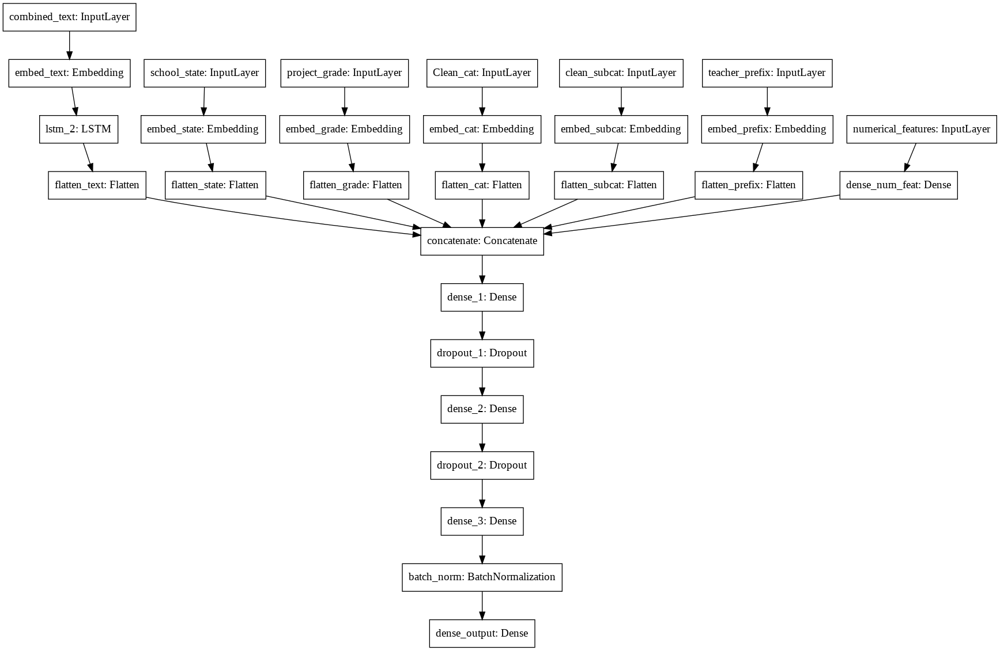

In [ ]:
tf.keras.utils.plot_model(model_1, 'model_1.png', show_shapes=False)

In [ ]:
model_1.summary()

Model: "model-1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
combined_text (InputLayer)      [(None, 400)]        0                                            
__________________________________________________________________________________________________
embed_text (Embedding)          (None, 400, 300)     1500000     combined_text[0][0]              
__________________________________________________________________________________________________
school_state (InputLayer)       [(None, 1)]          0                                            
__________________________________________________________________________________________________
project_grade (InputLayer)      [(None, 1)]          0                                            
____________________________________________________________________________________________

### 2.1 Callbacks

In [ ]:
#https://colab.research.google.com/github/tensorflow/tensorboard/blob/master/docs/tensorboard_in_notebooks.ipynb
from tensorflow.keras.callbacks import TensorBoard

tb_path = '/content/drive/My Drive/Applied AI/Assignment/Assign 16- LSTM/callbacks/tensorboard_model_1/'
tb = TensorBoard(log_dir=tb_path, histogram_freq=2, write_graph=True)

In [ ]:
#https://medium.com/@mukesh.kumar43585/model-checkpoint-google-colab-and-drive-as-persistent-storage-for-long-training-runs-e35ffa0c33d9
from tensorflow.keras.callbacks import ModelCheckpoint
checkpoint_path = '/content/drive/My Drive/Applied AI/Assignment/Assign 16- LSTM/callbacks/checkpoint_model_1/weights.{epoch:02d}-{val_loss:.2f}.hdf5'
checkpoint = ModelCheckpoint(checkpoint_path, monitor='val_auroc', verbose=1, save_best_only=True, mode='max')

In [ ]:
#Early stopping
from tensorflow.keras.callbacks import EarlyStopping
early_stopping = EarlyStopping(monitor='val_loss', patience=10, verbose=2, mode='min', restore_best_weights=True)

In [ ]:
#Reduce learning rate
from tensorflow.keras.callbacks import ReduceLROnPlateau
reduce_lr = ReduceLROnPlateau(monitor='val_auroc', factor=0.1)

In [ ]:
#https://github.com/taomanwai/tensorboardcolab
# https://medium.com/@mukesh.kumar43585/model-checkpoint-google-colab-and-drive-as-persistent-storage-for-long-training-runs-e35ffa0c33d9

callbacks_list = [tb, checkpoint, early_stopping, reduce_lr]

## 2.2 Metrics

In [ ]:
#https://stackoverflow.com/questions/41032551/how-to-compute-receiving-operating-characteristic-roc-and-auc-in-keras
import tensorflow as tf
from sklearn.metrics import roc_auc_score
def auc1(y_true, y_pred):                      #if there is only one class in y_true return roc score as 0.5
    if len(np.unique(y_true[:,1])) == 1:
        return 0.5
    else:
        return roc_auc_score(y_true, y_pred)

def auroc(y_true, y_pred):
    return tf.py_function(auc1, (y_true, y_pred), tf.double)

## 2.3 Model Compile

In [ ]:
#compile
model_1.compile(optimizer='adam', loss='categorical_crossentropy', metrics=[auroc])

In [ ]:
batch_size = 128
epochs = 50

In [ ]:
train_data_1 = [X_train_combined_text, X_train_Sstate, X_train_grade, X_train_cat, X_train_subcat, X_train_prefix, num_features_train]
val_data_1 = [X_val_combined_text, X_val_Sstate, X_val_grade, X_val_cat, X_val_subcat, X_val_prefix, num_features_val]

## 2.4 Model fit

In [ ]:
history_1 = model_1.fit(train_data_1, y_train, callbacks=callbacks_list, validation_data=(val_data_1, y_val), verbose=2, batch_size=batch_size, epochs=epochs)

Epoch 1/50

Epoch 00001: val_auroc improved from -inf to 0.60588, saving model to /content/drive/My Drive/Applied AI/Assignment/Assign 16- LSTM/callbacks/checkpoint_model_1/weights.01-0.51.hdf5
79/79 - 7s - loss: 0.7053 - auroc: 0.5038 - val_loss: 0.5116 - val_auroc: 0.6059 - lr: 0.0010
Epoch 2/50

Epoch 00002: val_auroc improved from 0.60588 to 0.62823, saving model to /content/drive/My Drive/Applied AI/Assignment/Assign 16- LSTM/callbacks/checkpoint_model_1/weights.02-0.43.hdf5
79/79 - 7s - loss: 0.4919 - auroc: 0.5284 - val_loss: 0.4276 - val_auroc: 0.6282 - lr: 0.0010
Epoch 3/50

Epoch 00003: val_auroc improved from 0.62823 to 0.65817, saving model to /content/drive/My Drive/Applied AI/Assignment/Assign 16- LSTM/callbacks/checkpoint_model_1/weights.03-0.42.hdf5
79/79 - 7s - loss: 0.4400 - auroc: 0.5640 - val_loss: 0.4203 - val_auroc: 0.6582 - lr: 0.0010
Epoch 4/50

Epoch 00004: val_auroc improved from 0.65817 to 0.67422, saving model to /content/drive/My Drive/Applied AI/Assignment

In [ ]:
y_pred_1 = model_1.predict(val_data_1)
print('AUC score:', roc_auc_score(y_val, y_pred_1))

AUC score: 0.7071735251007647


### 2.1.6 Tensorboard images

In [ ]:
# Load the TensorBoard notebook extension
%load_ext tensorboard

%tensorboard --logdir '/content/drive/My Drive/Applied AI/Assignment/Assign 16- LSTM/callbacks/tensorboard_model_1/'

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

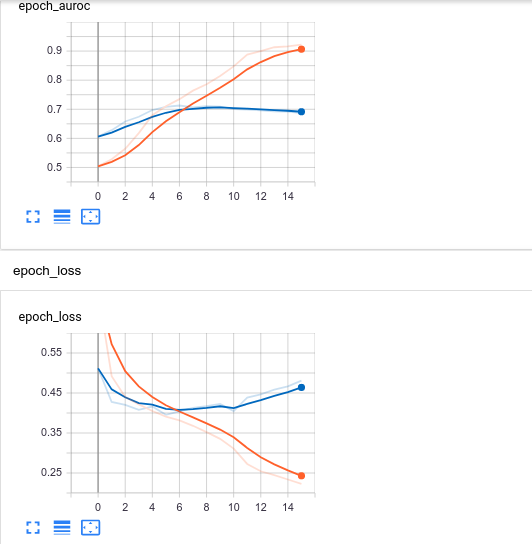

In [ ]:
from IPython.display import Image
Image('/content/drive/My Drive/Applied AI/Assignment /*Assign 16- LSTM /model_1_lstm.png')

# 3.Model -2:
- Taking tfidf of essay and remove low idf and high idf words

In [ ]:
data.head()

,Unnamed: 0,school_state,teacher_prefix,project_grade_category,teacher_number_of_previously_posted_projects,project_is_approved,clean_categories,clean_subcategories,essay,price,title,quantity,sentiment_score,No of words in project title,No of words in essay
0,0,ca,mrs,grades_prek_2,53,1,math_science,appliedsciences health_lifescience,i fortunate enough use fairy tale stem kits cl...,725.05,educational support english learners home,23,0.323506,5,175
1,1,ut,ms,grades_3_5,4,1,specialneeds,specialneeds,imagine 8 9 years old you third grade classroo...,213.03,wanted projector hungry learners,1,0.293008,4,179
2,2,ca,mrs,grades_prek_2,10,1,literacy_language,literacy,having class 24 students comes diverse learner...,329.00,soccer equipment awesome middle school students,22,0.313000,6,116
3,3,ga,mrs,grades_prek_2,2,1,appliedlearning,earlydevelopment,i recently read article giving students choice...,481.04,techie kindergarteners,4,0.123264,2,127
4,4,wa,mrs,grades_3_5,2,1,literacy_language,literacy,my students crave challenge eat obstacles brea...,17.74,interactive math tools,4,0.160651,3,114


### 3.1Tfidf Vectorizer

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
vec = TfidfVectorizer()
vec.fit(X_train['essay'].values)
train_essay_tfidf = vec.transform(X_train['essay'].values)
val_essay_tfidf = vec.transform(X_val['essay'].values)
test_essay_tfidf = vec.transform(X_test['essay'].values)

In [ ]:
idf_words = dict(zip(vec.get_feature_names(), vec.idf_))

In [ ]:
print(len(idf_words))

47343


### 3.2 Boxplot in idf values

In [ ]:
idf = []
for k,v in idf_words.items():
    idf.append(v)

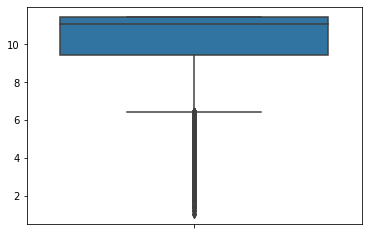

In [ ]:
import seaborn as sns
sns.boxplot(y=idf)
plt.show()

### Note:
- We can see that mean of the idf values lies around 10.5 and anything less than 3 is not useful because they are rare words and also anything over 10.5 also not useful because they are frequent words. From this plot we can set a threshold like idf less than 3 and idf values more than 10.5 will not be useful

### 3.3 Percentiles

In [ ]:
#for every 10th percentile
for i in range(0,100, 10):
    print(f'the {i}th percentile of idf :', np.percentile(idf, i))

the 0th percentile of idf : 1.0075658420924976
the 10th percentile of idf : 7.445562506855311
the 20th percentile of idf : 8.896996170146164
the 30th percentile of idf : 9.8525076151736
the 40th percentile of idf : 10.545654795733544
the 50th percentile of idf : 11.056480419499536
the 60th percentile of idf : 11.056480419499536
the 70th percentile of idf : 11.4619455276077
the 80th percentile of idf : 11.4619455276077
the 90th percentile of idf : 11.4619455276077


In [ ]:
#for 1 - 10 th percentile
for i in range(0,11):
    print(f'the {i}th percentile of idf :', np.percentile(idf, i))

the 0th percentile of idf : 1.0075658420924976
the 1th percentile of idf : 4.04992596902919
the 2th percentile of idf : 4.887567280339473
the 3th percentile of idf : 5.403991239230884
the 4th percentile of idf : 5.79379023059465
the 5th percentile of idf : 6.176460428826842
the 6th percentile of idf : 6.497425502976704
the 7th percentile of idf : 6.770597645378556
the 8th percentile of idf : 7.013429151664985
the 9th percentile of idf : 7.235111782339519
the 10th percentile of idf : 7.445562506855311


### Note:
- We can see that around 90% of words has idf values less than 11.4 and and 4% of words has idf values less than 4.04

In [ ]:
# we further look into 10-20% to get the lower idf value
for i in range(90,101):
    print(f'the {i}th percentile of idf :', np.percentile(idf, i))

the 90th percentile of idf : 11.4619455276077
the 91th percentile of idf : 11.4619455276077
the 92th percentile of idf : 11.4619455276077
the 93th percentile of idf : 11.4619455276077
the 94th percentile of idf : 11.4619455276077
the 95th percentile of idf : 11.4619455276077
the 96th percentile of idf : 11.4619455276077
the 97th percentile of idf : 11.4619455276077
the 98th percentile of idf : 11.4619455276077
the 99th percentile of idf : 11.4619455276077
the 100th percentile of idf : 11.4619455276077


### Summary:
- We could remove words whose idf values less than 4.04 and more than 11

In [ ]:
final_idf = {}
for word, idf_value in idf_words.items():
    if float(idf_value)>4.04 and float(idf_value)<11:
        final_idf[word] = idf_value

In [ ]:
print(len(idf_words))
print(len(final_idf))

47343
23096


In [ ]:
final_words = []
for k,v in final_idf.items():
    final_words.append(k)

In [ ]:
len(final_words)

23096

### Note: 
- We got 23096 words from 47343 words by removing the idf values less than 4.04 and greater than 11

### 3.4 Applying tokenizer on final_words

In [ ]:
from tensorflow.keras.preprocessing.text import Tokenizer
tokenizer = Tokenizer()
tokenizer.fit_on_texts(final_words)
token_essay_train = tokenizer.texts_to_sequences(X_train['essay'].values)
token_essay_val = tokenizer.texts_to_sequences(X_val['essay'].values)

In [ ]:
#finding the maximum length of after tokenization
max(len(i) for i in token_essay_train)

183

In [ ]:
max_length = 200
X_train_essay = pad_sequences(token_essay_train, maxlen=max_length, padding='post')
X_val_essay = pad_sequences(token_essay_val, maxlen=max_length, padding='post')

In [ ]:
print(X_train_essay.shape)
print(X_val_essay.shape)

(69918, 200)
(21850, 200)


In [ ]:
X_train_essay = X_train_essay[0:10000]
print(X_train_essay.shape)

(10000, 200)


### 3.5 Embedding matrix

In [ ]:
with open('/content/drive/My Drive/Applied AI/Datasets/New Donors/glove_vectors', 'rb') as f:
    glove_model = pickle.load(f)
    glove_words = set(model.keys())

In [ ]:
max_words = len(tokenizer.word_index.items())
print(max_words)

23096


In [ ]:
embedding_matrix_1 = np.zeros((max_words+1, 300))

for word, i in tokenizer.word_index.items():
    if word in glove_words:
       embedding_vector = glove_model[word]
       embedding_matrix_1[i] = embedding_vector

In [ ]:
embedding_matrix_1

array([[ 0.       ,  0.       ,  0.       , ...,  0.       ,  0.       ,
         0.       ],
       [ 0.38311  ,  0.58955  , -0.42684  , ...,  0.34844  ,  0.28596  ,
        -0.17433  ],
       [ 0.12829  ,  0.28556  , -0.50288  , ...,  0.078814 , -0.0054958,
        -0.23956  ],
       ...,
       [-0.33634  ,  0.3764   ,  1.0234   , ...,  0.39171  ,  0.15036  ,
        -0.42412  ],
       [ 0.12231  ,  0.13381  ,  0.60253  , ..., -0.37781  , -0.23027  ,
         0.060408 ],
       [ 0.73415  , -0.5235   , -0.20538  , ..., -0.19308  ,  0.46632  ,
        -0.47861  ]])

### 3.6 Model Architecture

In [ ]:
#https://www.tensorflow.org/guide/keras/functional

# 1.combined text
#input_combined_text = Input(shape=(len(X_train_combined_text_embed[0]),), name='combined_text')
input_essay = tf.keras.Input(shape=(X_train_essay.shape[1]), name='essay')
embedding_layer_essay = tf.keras.layers.Embedding(max_words+1,                                    # number of words in vocabulary
                                                  300,                                          #300 dim of glove model
                                                  input_length=X_train_essay.shape[1],          #200 max sequence length
                                                  weights=[embedding_matrix_1], trainable=False,
                                                  name = 'embed_essay')(input_essay)
lstm_essay = tf.keras.layers.LSTM(5, return_sequences=True)(embedding_layer_essay)
flatten_essay = tf.keras.layers.Flatten(name='flatten_essay')(lstm_essay)

# 2.School state
input_Sstate = tf.keras.Input(shape=(X_train_Sstate.shape[1]), name='school_state')
embedding_layer_Sstate = tf.keras.layers.Embedding(input_dim=num_words_Sstate,                          # 51 unique states +1
                                                   output_dim=op_embedding_dim_Sstate,                  # 26 
                                                   input_length=X_train_Sstate.shape[1],                # 1
                                                   name = 'embed_state')(input_Sstate)  
flatten_Sstate = tf.keras.layers.Flatten(name='flatten_state')(embedding_layer_Sstate)

# 3.Project grade
input_grade = tf.keras.Input(shape=(X_train_grade.shape[1]), name='project_grade')
embedding_layer_grade = tf.keras.layers.Embedding(input_dim=num_words_grade,                            # 4 grades +1 
                                                  output_dim=op_embedding_dim_grade,                    # 2
                                                  input_length=X_train_grade.shape[1],                  # 1
                                                  name = 'embed_grade')(input_grade)     
flatten_grade = tf.keras.layers.Flatten(name='flatten_grade')(embedding_layer_grade)

# 4.Categories
input_cat = tf.keras.Input(shape=(X_train_cat.shape[1]), name='Clean_cat')
embedding_layer_cat = tf.keras.layers.Embedding(input_dim=num_words_cat,                                # 51 category +1
                                                output_dim=op_embedding_dim_cat,                        # 26                                                 
                                                input_length=X_train_cat.shape[1],                      # 1
                                                name='embed_cat')(input_cat)           
flatten_cat = tf.keras.layers.Flatten(name='flatten_cat')(embedding_layer_cat)

# 5.Sub categories
input_subcat = tf.keras.Input(shape=(X_train_subcat.shape[1]), name='clean_subcat')
embedding_layer_subcat = tf.keras.layers.Embedding(input_dim=num_words_subcat,                          # 392 subcat +1
                                                   output_dim=op_embedding_dim_subcat,                  # 50
                                                   input_length=X_train_subcat.shape[1],                # 1
                                                   name='embed_subcat')(input_subcat)  
flatten_subcat = tf.keras.layers.Flatten(name='flatten_subcat')(embedding_layer_subcat)

# 6.Teacher prefix
input_prefix = tf.keras.Input(shape=(X_train_prefix.shape[1]), name='teacher_prefix')
embedding_layer_prefix = tf.keras.layers.Embedding(input_dim=num_words_prefix,                          # 5 prefix + 1
                                                   output_dim=op_embedding_dim_prefix,                  # 3
                                                   input_length=X_train_prefix.shape[1],                # 1
                                                   name='embed_prefix')(input_prefix)  
flatten_prefix = tf.keras.layers.Flatten(name='flatten_prefix')(embedding_layer_prefix)

# 7.Numerical features
input_num_feat = tf.keras.Input(shape=(3,), name='numerical_features')  # 3 for each numerical feature after concat
dense_num_feat = tf.keras.layers.Dense(1, activation='relu', name='dense_num_feat')(input_num_feat)

#Concatenate and flatten
concat_layers = tf.keras.layers.concatenate([flatten_essay, flatten_Sstate, flatten_grade, flatten_cat, flatten_subcat, flatten_prefix, dense_num_feat], name='concatenate')

#Dense layer
x = tf.keras.layers.Dense(256, activation='relu', name='dense_1')(concat_layers)
x = tf.keras.layers.Dropout(0.5, name='dropou_1')(x)
x = tf.keras.layers.Dense(128, activation='relu', name='dense_2')(x)
x = tf.keras.layers.Dropout(0.4, name='dropout_2')(x)
x = tf.keras.layers.Dense(64, activation='relu', name='dense_3')(x)

#output
output = tf.keras.layers.Dense(2, activation='softmax', name='dense_output')(x)

inputs = [input_essay, input_Sstate, input_grade, input_cat, input_subcat, input_prefix, input_num_feat]
model_2 = tf.keras.Model(inputs=inputs, outputs=output, name='model-1')

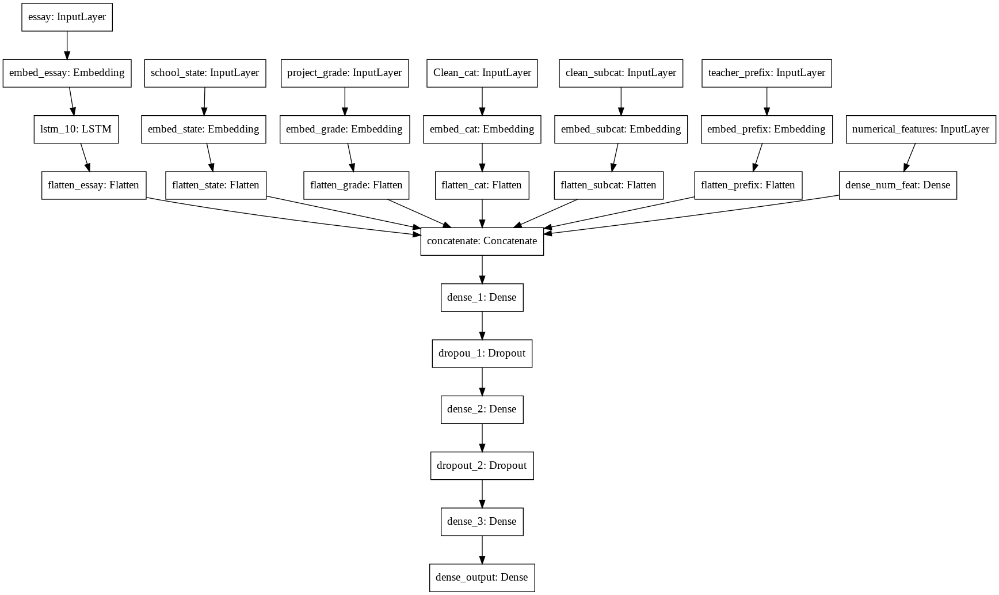

In [ ]:
tf.keras.utils.plot_model(model_2, 'model_2.png', show_shapes=False)

In [ ]:
model_2.summary()

Model: "model-1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
essay (InputLayer)              [(None, 200)]        0                                            
__________________________________________________________________________________________________
embed_essay (Embedding)         (None, 200, 300)     6929100     essay[0][0]                      
__________________________________________________________________________________________________
school_state (InputLayer)       [(None, 1)]          0                                            
__________________________________________________________________________________________________
project_grade (InputLayer)      [(None, 1)]          0                                            
____________________________________________________________________________________________

### 3.7 Callbacks

In [ ]:
#https://colab.research.google.com/github/tensorflow/tensorboard/blob/master/docs/tensorboard_in_notebooks.ipynb
from tensorflow.keras.callbacks import TensorBoard

tb_path = '/content/drive/My Drive/Applied AI/Assignment/Assign 16- LSTM/callbacks/tensorboard_model_2/'
tb = TensorBoard(log_dir=tb_path, histogram_freq=2, write_graph=True)

In [ ]:
#https://medium.com/@mukesh.kumar43585/model-checkpoint-google-colab-and-drive-as-persistent-storage-for-long-training-runs-e35ffa0c33d9
from tensorflow.keras.callbacks import ModelCheckpoint
checkpoint_path = '/content/drive/My Drive/Applied AI/Assignment/Assign 16- LSTM/callbacks/checkpoint_model_2/ weights.{epoch:02d}-{val_loss:.2f}.hdf5'
checkpoint = ModelCheckpoint(checkpoint_path, monitor='val_auroc', verbose=1, save_best_only=True, mode='max')

In [ ]:
#Early stopping
from tensorflow.keras.callbacks import EarlyStopping
early_stopping = EarlyStopping(monitor='val_loss', patience=10, verbose=2, mode='min', restore_best_weights=True)

In [ ]:
#Reduce learning rate
from tensorflow.keras.callbacks import ReduceLROnPlateau
reduce_lr = ReduceLROnPlateau(monitor='val_auroc', factor=0.1)

In [ ]:
#https://github.com/taomanwai/tensorboardcolab
# https://medium.com/@mukesh.kumar43585/model-checkpoint-google-colab-and-drive-as-persistent-storage-for-long-training-runs-e35ffa0c33d9

callbacks_list = [tb, checkpoint, early_stopping, reduce_lr]

### 3.8 Custom Metrics- AUC ROC

In [ ]:
#https://stackoverflow.com/questions/41032551/how-to-compute-receiving-operating-characteristic-roc-and-auc-in-keras
import tensorflow as tf
from sklearn.metrics import roc_auc_score
def auc1(y_true, y_pred):                      #if there is only one class in y_true return roc score as 0.5
    if len(np.unique(y_true[:,1])) == 1:
        return 0.5
    else:
        return roc_auc_score(y_true, y_pred)

def auroc(y_true, y_pred):
    return tf.py_function(auc1, (y_true, y_pred), tf.double)

### 3.9 Model compile

In [ ]:
#compile
model_2.compile(optimizer='adam', loss='categorical_crossentropy', metrics=[auroc])

In [ ]:
batch_size = 128
epochs = 50

In [ ]:
train_data_2 = [X_train_essay, X_train_Sstate, X_train_grade, X_train_cat, X_train_subcat, X_train_prefix, num_features_train]
val_data_2 = [X_val_essay, X_val_Sstate, X_val_grade, X_val_cat, X_val_subcat, X_val_prefix, num_features_val]

### 3.10 Model Fit

In [ ]:
history_2 = model_2.fit(train_data_2, y_train, callbacks=callbacks_list, validation_data=(val_data_2, y_val), verbose=2, batch_size=batch_size, epochs=epochs)

Epoch 1/50

Epoch 00001: val_auroc did not improve from 0.66929
79/79 - 5s - loss: 0.4464 - auroc: 0.5710 - val_loss: 0.4057 - val_auroc: 0.6604 - lr: 0.0010
Epoch 2/50

Epoch 00002: val_auroc improved from 0.66929 to 0.67450, saving model to /content/drive/My Drive/Applied AI/Assignment/Assign 16- LSTM/callbacks/checkpoint_model_2/ weights.02-0.40.hdf5
79/79 - 4s - loss: 0.4086 - auroc: 0.6693 - val_loss: 0.4015 - val_auroc: 0.6745 - lr: 0.0010
Epoch 3/50

Epoch 00003: val_auroc improved from 0.67450 to 0.67648, saving model to /content/drive/My Drive/Applied AI/Assignment/Assign 16- LSTM/callbacks/checkpoint_model_2/ weights.03-0.40.hdf5
79/79 - 5s - loss: 0.3922 - auroc: 0.7246 - val_loss: 0.4019 - val_auroc: 0.6765 - lr: 0.0010
Epoch 4/50

Epoch 00004: val_auroc did not improve from 0.67648
79/79 - 4s - loss: 0.3744 - auroc: 0.7557 - val_loss: 0.4061 - val_auroc: 0.6740 - lr: 0.0010
Epoch 5/50

Epoch 00005: val_auroc did not improve from 0.67648
79/79 - 5s - loss: 0.3539 - auroc: 0

In [ ]:
y_pred_2 = model_2.predict(val_data_2)
print('The AUC score :', roc_auc_score(y_val, y_pred_2))

The AUC score : 0.6746252046238501


### 3.11 Tensorboard Images - model 2

In [ ]:
# Load the TensorBoard notebook extension
%load_ext tensorboard

%tensorboard --logdir '/content/drive/My Drive/Applied AI/Assignment/Assign 16- LSTM/callbacks/tensorboard_model_2/'

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

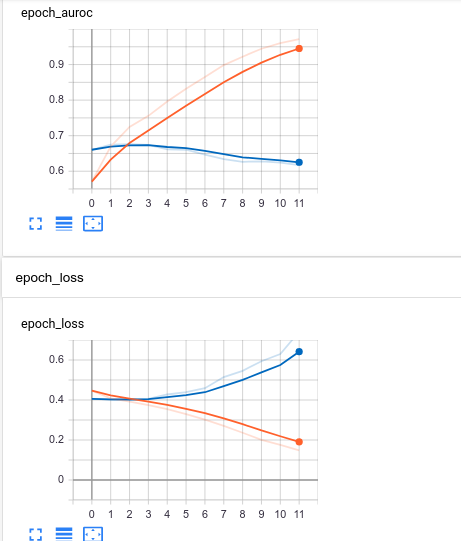

In [ ]:
from IPython.display import Image
Image('/content/drive/My Drive/Applied AI/Assignment /*Assign 16- LSTM /model_2_lstm.png')

# 4. Model-3:

In [ ]:
data.head()

,Unnamed: 0,school_state,teacher_prefix,project_grade_category,teacher_number_of_previously_posted_projects,project_is_approved,clean_categories,clean_subcategories,essay,price,title,quantity,sentiment_score,No of words in project title,No of words in essay
0,0,ca,mrs,grades_prek_2,53,1,math_science,appliedsciences health_lifescience,i fortunate enough use fairy tale stem kits cl...,725.05,educational support english learners home,23,0.323506,5,175
1,1,ut,ms,grades_3_5,4,1,specialneeds,specialneeds,imagine 8 9 years old you third grade classroo...,213.03,wanted projector hungry learners,1,0.293008,4,179
2,2,ca,mrs,grades_prek_2,10,1,literacy_language,literacy,having class 24 students comes diverse learner...,329.00,soccer equipment awesome middle school students,22,0.313000,6,116
3,3,ga,mrs,grades_prek_2,2,1,appliedlearning,earlydevelopment,i recently read article giving students choice...,481.04,techie kindergarteners,4,0.123264,2,127
4,4,wa,mrs,grades_3_5,2,1,literacy_language,literacy,my students crave challenge eat obstacles brea...,17.74,interactive math tools,4,0.160651,3,114


### 4.1 School State

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
count_state = CountVectorizer()
count_state.fit(X_train['school_state'])
X_train_Sstate_3 = count_state.transform(X_train['school_state'])
X_val_Sstate_3 = count_state.transform(X_val['school_state'])
X_test_Sstate_3 = count_state.transform(X_test['school_state'])

In [ ]:
print(X_train_Sstate_3.shape)
print(X_val_Sstate_3.shape)
print(X_test_Sstate_3.shape)

(69918, 51)
(21850, 51)
(17480, 51)


### 4.2 Clean Category

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
count_cat = CountVectorizer()
count_cat.fit(X_train['clean_categories'])
X_train_cat_3 = count_cat.transform(X_train['clean_categories'])
X_val_cat_3 = count_cat.transform(X_val['clean_categories'])
X_test_cat_3 = count_cat.transform(X_test['clean_categories'])

In [ ]:
print(X_train_cat_3.shape)
print(X_val_cat_3.shape)
print(X_test_cat_3.shape)

(69918, 9)
(21850, 9)
(17480, 9)


### 4.3 Clean Subcategory

In [ ]:
count_subcat = CountVectorizer()
count_subcat.fit(X_train['clean_subcategories'])
X_train_subcat_3 = count_subcat.transform(X_train['clean_subcategories'])
X_val_subcat_3 = count_subcat.transform(X_val['clean_subcategories'])
X_test_subcat_3 = count_subcat.transform(X_test['clean_subcategories'])

In [ ]:
print(X_train_subcat_3.shape)
print(X_val_subcat_3.shape)
print(X_test_subcat_3.shape)

(69918, 30)
(21850, 30)
(17480, 30)


### 4.4 Project grade

In [ ]:
count_grade = CountVectorizer()
count_grade.fit(X_train['project_grade_category'])
X_train_grade_3 = count_grade.transform(X_train['project_grade_category'])
X_val_grade_3 = count_grade.transform(X_val['project_grade_category'])
X_test_grade_3 = count_grade.transform(X_test['project_grade_category'])

In [ ]:
print(X_train_grade_3.shape)
print(X_val_grade_3.shape)
print(X_test_grade_3.shape)

(69918, 4)
(21850, 4)
(17480, 4)


### 4.5 Teacher Prefix

In [ ]:
count_prefix = CountVectorizer()
count_prefix.fit(X_train['teacher_prefix'])
X_train_prefix_3 = count_prefix.transform(X_train['teacher_prefix'])
X_val_prefix_3 = count_prefix.transform(X_val['teacher_prefix'])
X_test_prefix_3 = count_prefix.transform(X_test['teacher_prefix'])

In [ ]:
print(X_train_prefix_3.shape)
print(X_val_prefix_3.shape)
print(X_test_prefix_3.shape)

(69918, 5)
(21850, 5)
(17480, 5)


### 4.6 Concatenate all categorical variabels

In [ ]:
from scipy.sparse import hstack
categorical_train = hstack([X_train_Sstate_3, X_train_cat_3, X_train_subcat_3, X_train_grade_3, X_train_prefix_3]).todense()
categorical_val = hstack([X_val_Sstate_3, X_val_cat_3, X_val_subcat_3, X_val_grade_3, X_val_prefix_3]).todense()
categorical_test = hstack([X_test_Sstate_3, X_test_cat_3, X_test_subcat_3, X_test_grade_3, X_test_prefix_3]).todense()

In [ ]:
print(categorical_train.shape)
print(categorical_val.shape)
print(categorical_test.shape)

(69918, 99)
(21850, 99)
(17480, 99)


In [ ]:
categorical_train = categorical_train[0:10000]
print(categorical_train.shape)

(10000, 99)


### 4.7 concatenate numerical values

In [ ]:
#concatenate all numerical features
num_features_train = np.concatenate((X_train_price, X_train_previous, X_train_quantity), axis=1)
num_features_val = np.concatenate((X_val_price, X_val_previous, X_val_quantity), axis=1)

### 4.8 Concatenate both cat and num variables

In [ ]:
X_train_3 = np.hstack((categorical_train, num_features_train))
X_val_3 = np.hstack((categorical_val, num_features_val))

In [ ]:
print(X_train_3.shape)
print(X_val_3.shape)

(10000, 102)
(21850, 102)


### Note:
- For Conv1D we need input dimension of (batch_size, steps, input_dim) . Here we have batch size can be considered as a 10000, steps is 102 and we need input_dim of 1 bcoz conv1D goes only in one dimension

In [ ]:
X_train_3 = np.expand_dims(X_train_3, axis=2)
X_val_3 = np.expand_dims(X_val_3, axis=2)

print(X_train_3.shape)
print(X_val_3.shape)

(10000, 102, 1)
(21850, 102, 1)


### 4.9 Architecture

In [ ]:
from tensorflow.keras.regularizers import l2

In [ ]:
#https://www.tensorflow.org/guide/keras/functional

# 1.combined text
#input_combined_text = Input(shape=(len(X_train_combined_text_embed[0]),), name='combined_text')
input_combined_text = tf.keras.Input(shape=(X_train_combined_text.shape[1]), name='combined_text')
embedding_layer_combined_text = tf.keras.layers.Embedding(max_words_combined_text,                      #5000 number of words in vocabulary
                                                          op_embedding_dim_combined_text,               #300 dim of glove model
                                                          input_length=X_train_combined_text.shape[1],  #400 max sequence length
                                                          weights=[embedding_matrix], trainable=False,
                                                          name = 'embed_text')(input_combined_text)
lstm_combined_text = tf.keras.layers.LSTM(5, return_sequences=True)(embedding_layer_combined_text)
flatten_combined_text = tf.keras.layers.Flatten(name='flatten_text')(lstm_combined_text)

#Conv1D
input_conv = tf.keras.Input(shape=(102,1), name='all_features')
x = tf.keras.layers.Conv1D(filters=128, kernel_size=3, activation='relu', kernel_initializer='he_normal', name='conv-1')(input_conv)
x = tf.keras.layers.Conv1D(filters=128, kernel_size=3, activation='relu', kernel_initializer='he_normal', name='conv-2')(x)
flatten_all = tf.keras.layers.Flatten(name='flatten_all')(x)

#concatenate
concatenate = tf.keras.layers.concatenate([flatten_combined_text, flatten_all], name='concatenate')

#Dense
x = tf.keras.layers.Dense(16, activation='relu', name='Dense_1', kernel_regularizer=l2(0.001))(concatenate)
x = tf.keras.layers.Dropout(0.5, name='dropout_1')(x)
x = tf.keras.layers.Dense(8, activation='relu', name='Dense_2', kernel_regularizer=l2(0.001))(x)
x = tf.keras.layers.Dropout(0.3, name='dropout_2')(x)
x = tf.keras.layers.Dense(4, activation='relu', name='Dense_3', kernel_regularizer=l2(0.001))(x)

#output
output = tf.keras.layers.Dense(2, activation='softmax',name='softmax_layer')(x)

#model_3
model_3 = tf.keras.models.Model(inputs=[input_combined_text, input_conv], outputs=[output])

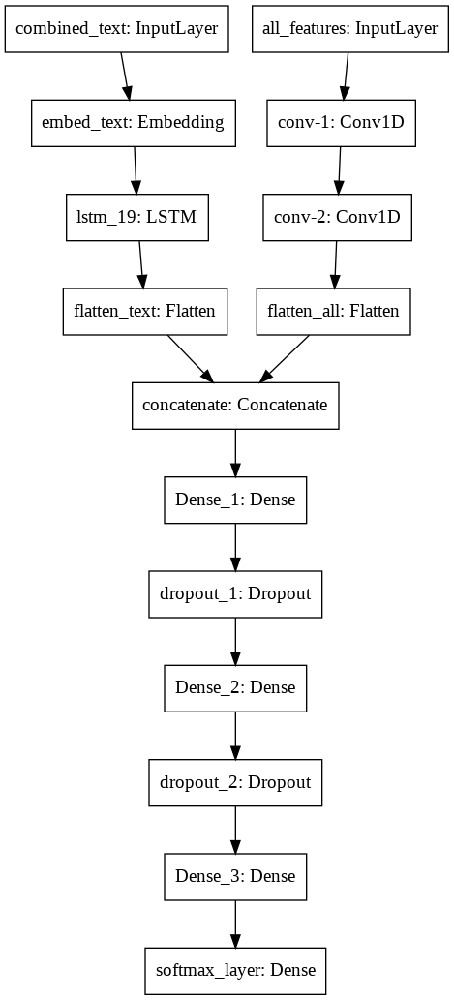

In [ ]:
tf.keras.utils.plot_model(model_3, 'model_3.png', show_shapes=False)

In [ ]:
model_3.summary()

Model: "model_7"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
combined_text (InputLayer)      [(None, 400)]        0                                            
__________________________________________________________________________________________________
all_features (InputLayer)       [(None, 102, 1)]     0                                            
__________________________________________________________________________________________________
embed_text (Embedding)          (None, 400, 300)     1500000     combined_text[0][0]              
__________________________________________________________________________________________________
conv-1 (Conv1D)                 (None, 100, 128)     512         all_features[0][0]               
____________________________________________________________________________________________

### 4.10 Callbacks

In [ ]:
#https://colab.research.google.com/github/tensorflow/tensorboard/blob/master/docs/tensorboard_in_notebooks.ipynb
from tensorflow.keras.callbacks import TensorBoard

# Load the TensorBoard notebook extension
%load_ext tensorboard

tb_path = '/content/drive/My Drive/Applied AI/Assignment /Assign 16- LSTM /callbacks/tensorboard_model_3/'
tb = TensorBoard(log_dir=tb_path, histogram_freq=2, write_graph=True)

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [ ]:
#https://medium.com/@mukesh.kumar43585/model-checkpoint-google-colab-and-drive-as-persistent-storage-for-long-training-runs-e35ffa0c33d9
from tensorflow.keras.callbacks import ModelCheckpoint
checkpoint_path = '/content/drive/My Drive/Applied AI/Assignment /Assign 16- LSTM /callbacks/callbacks/checkpoint_model_3/weights.{epoch:02d}-{val_loss:.2f}.hdf5'
checkpoint = ModelCheckpoint(checkpoint_path, monitor='val_loss', verbose=1, save_best_only=True, mode='min')

In [ ]:
#Early stopping
from tensorflow.keras.callbacks import EarlyStopping
early_stopping = EarlyStopping(monitor='val_loss', patience=10, verbose=2, mode='min', restore_best_weights=True)

In [ ]:
#Reduce learning rate
from tensorflow.keras.callbacks import ReduceLROnPlateau
reduce_lr = ReduceLROnPlateau(monitor='val_auroc', factor=0.1)

In [ ]:
#https://github.com/taomanwai/tensorboardcolab
# https://medium.com/@mukesh.kumar43585/model-checkpoint-google-colab-and-drive-as-persistent-storage-for-long-training-runs-e35ffa0c33d9

callbacks_list = [tb, checkpoint, early_stopping, reduce_lr]

### 4.11 Custom Metrics - ROC AUC

In [ ]:
#https://stackoverflow.com/questions/41032551/how-to-compute-receiving-operating-characteristic-roc-and-auc-in-keras
import tensorflow as tf
from sklearn.metrics import roc_auc_score
def auc1(y_true, y_pred):                      #if there is only one class in y_true return roc score as 0.5
    if len(np.unique(y_true[:,1])) == 1:
        return 0.5
    else:
        return roc_auc_score(y_true, y_pred)

def auroc(y_true, y_pred):
    return tf.py_function(auc1, (y_true, y_pred), tf.double)

### 4.12 Model Compile

In [ ]:
#compile
model_3.compile(optimizer='adam', loss='categorical_crossentropy', metrics=[auroc])

In [ ]:
batch_size = 128
epochs = 50

In [ ]:
print(X_train_combined_text.shape)
print(X_train_3.shape)

(10000, 400)
(10000, 102, 1)


In [ ]:
train_data_3 = [X_train_combined_text, X_train_3]
val_data_3 = [X_val_combined_text, X_val_3]

### 4.13 Model Fit

In [ ]:
history_3 = model_3.fit(train_data_3, y_train, callbacks=callbacks_list, validation_data=(val_data_3, y_val), verbose=2, epochs=epochs, batch_size=batch_size)

Epoch 1/50

Epoch 00001: val_loss improved from inf to 0.48379, saving model to /content/drive/My Drive/Applied AI/Assignment /Assign 16- LSTM /callbacks/callbacks/checkpoint_model_3/weights.01-0.48.hdf5
79/79 - 7s - loss: 0.5260 - auroc: 0.5313 - val_loss: 0.4838 - val_auroc: 0.6252 - lr: 0.0010
Epoch 2/50

Epoch 00002: val_loss improved from 0.48379 to 0.43267, saving model to /content/drive/My Drive/Applied AI/Assignment /Assign 16- LSTM /callbacks/callbacks/checkpoint_model_3/weights.02-0.43.hdf5
79/79 - 6s - loss: 0.4683 - auroc: 0.5998 - val_loss: 0.4327 - val_auroc: 0.6872 - lr: 0.0010
Epoch 3/50

Epoch 00003: val_loss improved from 0.43267 to 0.43170, saving model to /content/drive/My Drive/Applied AI/Assignment /Assign 16- LSTM /callbacks/callbacks/checkpoint_model_3/weights.03-0.43.hdf5
79/79 - 7s - loss: 0.4430 - auroc: 0.6565 - val_loss: 0.4317 - val_auroc: 0.7141 - lr: 0.0010
Epoch 4/50

Epoch 00004: val_loss improved from 0.43170 to 0.41753, saving model to /content/drive

In [ ]:
y_pred_3 = model_3.predict(val_data_3)
print('AUC score:', roc_auc_score(y_val, y_pred_3))

AUC score: 0.7267076236087175


### 4.14 Tensorboard Images

In [ ]:
%tensorboard --logdir '/content/drive/My Drive/Applied AI/Assignment/Assign 16- LSTM/callbacks/tensorboard_model_3/'

Reusing TensorBoard on port 6007 (pid 3676), started 0:54:04 ago. (Use '!kill 3676' to kill it.)

<IPython.core.display.Javascript object>

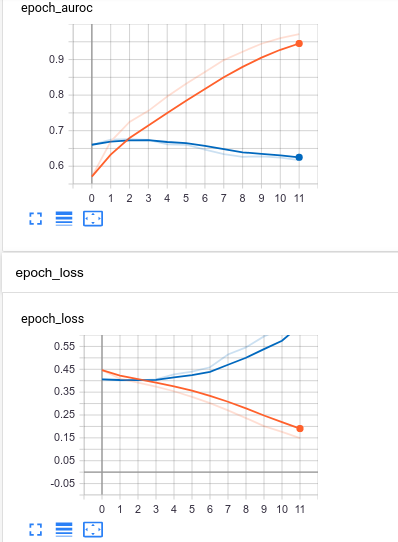

In [ ]:
Image('/content/drive/My Drive/Applied AI/Assignment /*Assign 16- LSTM /model_3_lstm.png')

# Summary:
- Even after tried so many parameters chanages and many epochs i get the best auc score of 0.72

In [ ]:

from prettytable import PrettyTable

x_pretty_table = PrettyTable()
x_pretty_table.field_names = ["Model", "AUC Score"]

x_pretty_table.add_row(["Model1","0.702"])
x_pretty_table.add_row(["Model2","0.67"])
x_pretty_table.add_row(["Model3","0.729"])


print(x_pretty_table)

+--------+-----------+
| Model  | AUC Score |
+--------+-----------+
| Model1 |   0.702   |
| Model2 |    0.67   |
| Model3 |   0.729   |
+--------+-----------+


# That's the end of the code